In [1]:
# Import necessary libraries
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation and analysis
import matplotlib.pyplot as plt  # For data visualization
import seaborn as sns  # For data visualization

from sklearn.model_selection import train_test_split  # For splitting the dataset into training and testing sets
from sklearn.feature_extraction.text import TfidfVectorizer  # For converting text data into TF-IDF vectors
from sklearn.naive_bayes import MultinomialNB  # For the Naive Bayes classification model
from sklearn.metrics import classification_report, confusion_matrix  # For model evaluation metrics

from sklearn.feature_extraction.text import CountVectorizer  # For converting text data into count vectors
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score  # For model evaluation metrics

from sklearn.linear_model import LogisticRegression  # For the Logistic Regression classification model

from nltk.corpus import stopwords  # For stopword removal
from nltk.tokenize import word_tokenize  # For tokenizing text data
from nltk.stem import PorterStemmer, WordNetLemmatizer  # For stemming and lemmatization

import re  # For regular expressions

import nltk  # Natural Language Toolkit
nltk.download('punkt')  # Downloading punkt tokenizer
nltk.download('stopwords')  # Downloading stopwords
nltk.download('wordnet')  # Downloading WordNet lemmatizer

# Import necessary libraries for machine learning models and evaluation
from sklearn.ensemble import RandomForestClassifier  # For Random Forest classification model
from sklearn.neighbors import KNeighborsClassifier  # For K-Nearest Neighbors classification model
from sklearn.svm import SVC  # For Support Vector Classification model
from sklearn.tree import DecisionTreeClassifier  # For Decision Tree classification model
from sklearn.linear_model import Perceptron  # For Perceptron classification model

# import pandas as pd
# from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# import seaborn as sns
# import matplotlib.pyplot as plt
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
# from sklearn.svm import SVC
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.linear_model import Perceptron

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [2]:
# Load the dataset
df = pd.read_csv('/content/BBC News Train.csv')
df.head()

,ArticleId,Text,Category
0,1833,worldcom ex-boss launches defence lawyers defe...,business
1,154,german business confidence slides german busin...,business
2,1101,bbc poll indicates economic gloom citizens in ...,business
3,1976,lifestyle governs mobile choice faster bett...,tech
4,917,enron bosses in $168m payout eighteen former e...,business


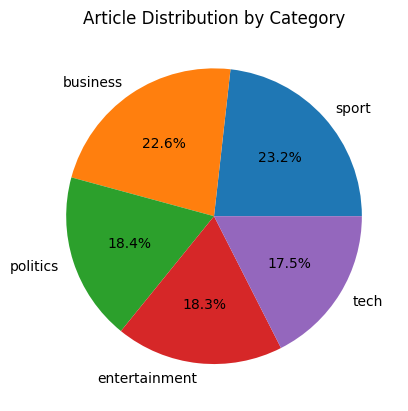

In [7]:
# @title Article Distribution by Category

import matplotlib.pyplot as plt

df['Category'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Article Distribution by Category')
_ = plt.ylabel('')

<ipython-input-6-035c596738c4>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(df, x='ArticleId', y='Category', inner='box', palette='Dark2')


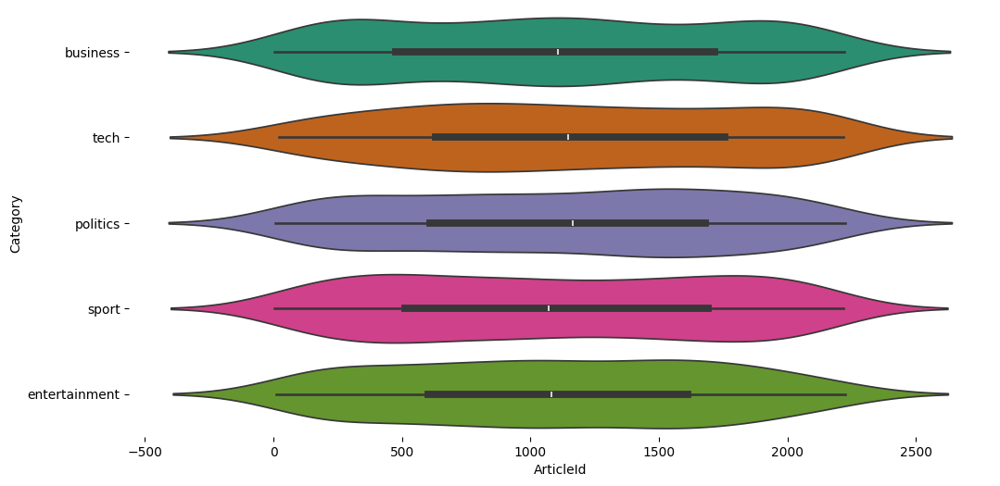

In [6]:
# @title Category vs ArticleId

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df['Category'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df, x='ArticleId', y='Category', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

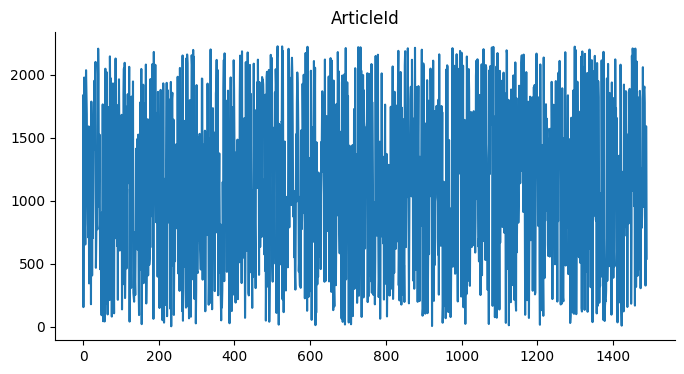

In [5]:
# @title ArticleId

from matplotlib import pyplot as plt
df['ArticleId'].plot(kind='line', figsize=(8, 4), title='ArticleId')
plt.gca().spines[['top', 'right']].set_visible(False)

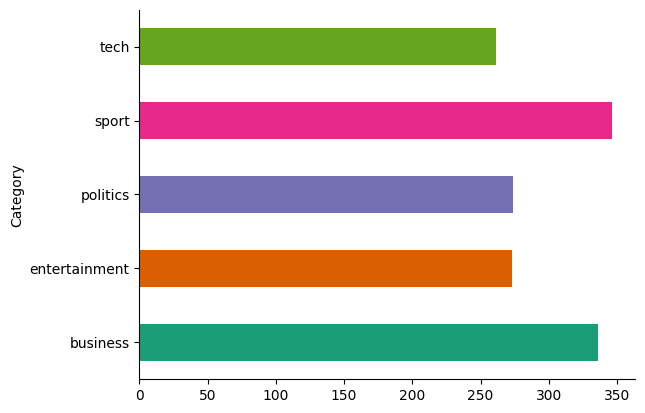

In [4]:
# @title Category

from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('Category').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

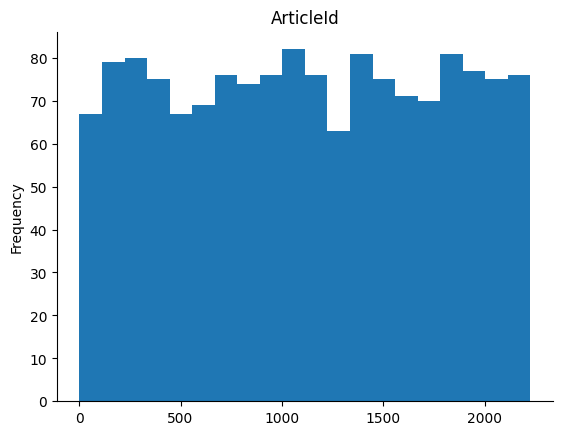

In [3]:
# @title ArticleId

from matplotlib import pyplot as plt
df['ArticleId'].plot(kind='hist', bins=20, title='ArticleId')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [9]:
# Explore the dataset structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1490 entries, 0 to 1489
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ArticleId  1490 non-null   int64 
 1   Text       1490 non-null   object
 2   Category   1490 non-null   object
dtypes: int64(1), object(2)
memory usage: 35.0+ KB


In [10]:
df.Text[0]

'worldcom ex-boss launches defence lawyers defending former worldcom chief bernie ebbers against a battery of fraud charges have called a company whistleblower as their first witness.  cynthia cooper  worldcom s ex-head of internal accounting  alerted directors to irregular accounting practices at the us telecoms giant in 2002. her warnings led to the collapse of the firm following the discovery of an $11bn (£5.7bn) accounting fraud. mr ebbers has pleaded not guilty to charges of fraud and conspiracy.  prosecution lawyers have argued that mr ebbers orchestrated a series of accounting tricks at worldcom  ordering employees to hide expenses and inflate revenues to meet wall street earnings estimates. but ms cooper  who now runs her own consulting business  told a jury in new york on wednesday that external auditors arthur andersen had approved worldcom s accounting in early 2001 and 2002. she said andersen had given a  green light  to the procedures and practices used by worldcom. mr ebb

In [11]:
#drop unnecessary col

df = df.drop(columns=['ArticleId'])
df.head()

,Text,Category
0,worldcom ex-boss launches defence lawyers defe...,business
1,german business confidence slides german busin...,business
2,bbc poll indicates economic gloom citizens in ...,business
3,lifestyle governs mobile choice faster bett...,tech
4,enron bosses in $168m payout eighteen former e...,business


In [12]:
print("\nDataFrame Summary Statistics:")
print(df.describe(include='all'), "\n")


DataFrame Summary Statistics:
                                                     Text Category
count                                                1490     1490
unique                                               1440        5
top     microsoft seeking spyware trojan microsoft is ...    sport
freq                                                    2      346 



In [13]:
# 3. Check for any missing values
print("Missing Values Check:")
print(df.isnull().sum(), "\n")

Missing Values Check:
Text        0
Category    0
dtype: int64 



In [14]:
# 4. Display the distribution of the 'Category' column
print("Distribution of Categories:")
print(df['Category'].value_counts(), "\n")

Distribution of Categories:
Category
sport            346
business         336
politics         274
entertainment    273
tech             261
Name: count, dtype: int64 



In [15]:
# 5. Display the unique categories in the 'Category' column
print("Unique Categories:")
print(df['Category'].unique(), "\n")

Unique Categories:
['business' 'tech' 'politics' 'sport' 'entertainment'] 



In [16]:
# 6. Check the length of the articles
df['Text_Length'] = df['Text'].apply(len)
print("Article Lengths:")
print(df['Text_Length'].describe(), "\n")

Article Lengths:
count     1490.000000
mean      2233.461745
std       1205.153358
min        501.000000
25%       1453.000000
50%       1961.000000
75%       2751.250000
max      18387.000000
Name: Text_Length, dtype: float64 



In [17]:
df

,Text,Category,Text_Length
0,worldcom ex-boss launches defence lawyers defe...,business,1866
1,german business confidence slides german busin...,business,2016
2,bbc poll indicates economic gloom citizens in ...,business,3104
3,lifestyle governs mobile choice faster bett...,tech,3618
4,enron bosses in $168m payout eighteen former e...,business,2190
...,...,...,...
1485,double eviction from big brother model caprice...,entertainment,1266
1486,dj double act revamp chart show dj duo jk and ...,entertainment,3111
1487,weak dollar hits reuters revenues at media gro...,business,1370
1488,apple ipod family expands market apple has exp...,tech,3242


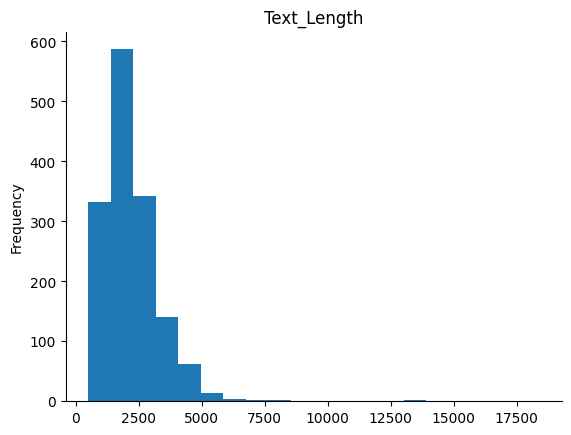

In [18]:
# @title Text_Length

from matplotlib import pyplot as plt
df['Text_Length'].plot(kind='hist', bins=20, title='Text_Length')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [19]:
# 7. Display the articles with the longest and shortest lengths
longest_article = df.loc[df['Text_Length'].idxmax()]
shortest_article = df.loc[df['Text_Length'].idxmin()]

print("Longest Article:")
print(longest_article, "\n")

print("Shortest Article:")
print(shortest_article, "\n")

Longest Article:
Text           minimum wage increased to £5.05 the minimum wa...
Category                                                politics
Text_Length                                                18387
Name: 1057, dtype: object 

Shortest Article:
Text           blunkett hints at election call ex-home secret...
Category                                                politics
Text_Length                                                  501
Name: 573, dtype: object 



In [20]:
chat_words = {
    "AFAIK": "As Far As I Know",
    "AFK": "Away From Keyboard",
    "ASAP": "As Soon As Possible",
    "ATK": "At The Keyboard",
    "ATM": "At The Moment",
    "A3": "Anytime, Anywhere, Anyplace",
    "BAK": "Back At Keyboard",
    "BBL": "Be Back Later",
    "BBS": "Be Back Soon",
    "BFN": "Bye For Now",
    "B4N": "Bye For Now",
    "BRB": "Be Right Back",
    "BRT": "Be Right There",
    "BTW": "By The Way",
    "B4": "Before",
    "B4N": "Bye For Now",
    "CU": "See You",
    "CUL8R": "See You Later",
    "CYA": "See You",
    "FAQ": "Frequently Asked Questions",
    "FC": "Fingers Crossed",
    "FWIW": "For What It's Worth",
    "FYI": "For Your Information",
    "GAL": "Get A Life",
    "GG": "Good Game",
    "GN": "Good Night",
    "GMTA": "Great Minds Think Alike",
    "GR8": "Great!",
    "G9": "Genius",
    "IC": "I See",
    "ICQ": "I Seek you (also a chat program)",
    "ILU": "ILU: I Love You",
    "IMHO": "In My Honest/Humble Opinion",
    "IMO": "In My Opinion",
    "IOW": "In Other Words",
    "IRL": "In Real Life",
    "KISS": "Keep It Simple, Stupid",
    "LDR": "Long Distance Relationship",
    "LMAO": "Laugh My A.. Off",
    "LOL": "Laughing Out Loud",
    "LTNS": "Long Time No See",
    "L8R": "Later",
    "MTE": "My Thoughts Exactly",
    "M8": "Mate",
    "NRN": "No Reply Necessary",
    "OIC": "Oh I See",
    "PITA": "Pain In The A..",
    "PRT": "Party",
    "PRW": "Parents Are Watching",
    "QPSA?": "Que Pasa?",
    "ROFL": "Rolling On The Floor Laughing",
    "ROFLOL": "Rolling On The Floor Laughing Out Loud",
    "ROTFLMAO": "Rolling On The Floor Laughing My A.. Off",
    "SK8": "Skate",
    "STATS": "Your sex and age",
    "ASL": "Age, Sex, Location",
    "THX": "Thank You",
    "TTFN": "Ta-Ta For Now!",
    "TTYL": "Talk To You Later",
    "U": "You",
    "U2": "You Too",
    "U4E": "Yours For Ever",
    "WB": "Welcome Back",
    "WTF": "What The F...",
    "WTG": "Way To Go!",
    "WUF": "Where Are You From?",
    "W8": "Wait...",
    "7K": "Sick:-D Laugher",
    "TFW": "That feeling when",
    "MFW": "My face when",
    "MRW": "My reaction when",
    "IFYP": "I feel your pain",
    "TNTL": "Trying not to laugh",
    "JK": "Just kidding",
    "IDC": "I don't care",
    "ILY": "I love you",
    "IMU": "I miss you",
    "ADIH": "Another day in hell",
    "ZZZ": "Sleeping, bored, tired",
    "WYWH": "Wish you were here",
    "TIME": "Tears in my eyes",
    "BAE": "Before anyone else",
    "FIMH": "Forever in my heart",
    "BSAAW": "Big smile and a wink",
    "BWL": "Bursting with laughter",
    "BFF": "Best friends forever",
    "CSL": "Can't stop laughing"
}


    - Lower Casing the text

In [21]:
# Lower Casing the text
df['Cleaned_Text'] = df['Text'].apply(lambda x:x.lower())

In [22]:
df.Cleaned_Text[3]

'lifestyle  governs mobile choice  faster  better or funkier hardware alone is not going to help phone firms sell more handsets  research suggests.  instead  phone firms keen to get more out of their customers should not just be pushing the technology for its own sake. consumers are far more interested in how handsets fit in with their lifestyle than they are in screen size  onboard memory or the chip inside  shows an in-depth study by handset maker ericsson.  historically in the industry there has been too much focus on using technology   said dr michael bjorn  senior advisor on mobile media at ericsson s consumer and enterprise lab.  we have to stop saying that these technologies will change their lives   he said.  we should try to speak to consumers in their own language and help them see how it fits in with what they are doing   he told the bbc news website.  for the study  ericsson interviewed 14 000 mobile phone owners on the ways they use their phone.  people s habits remain the

        - remove HTML tags

In [23]:
# Function to remove HTML tags
def remove_html_tags(text):
    clean = re.compile('<.*?>')
    return re.sub(clean, '', text)

# Apply the function to the 'Cleaned_Text' column
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_html_tags)

In [24]:
df.head()

,Text,Category,Text_Length,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,1866,worldcom ex-boss launches defence lawyers defe...
1,german business confidence slides german busin...,business,2016,german business confidence slides german busin...
2,bbc poll indicates economic gloom citizens in ...,business,3104,bbc poll indicates economic gloom citizens in ...
3,lifestyle governs mobile choice faster bett...,tech,3618,lifestyle governs mobile choice faster bett...
4,enron bosses in $168m payout eighteen former e...,business,2190,enron bosses in $168m payout eighteen former e...


    - Remove URLs

In [25]:
# Here We also Use Regular Expressions to Remove URLs from Text or Whole Corpus.
import re

# Function to remove URLs from text
def remove_urls(text):
    return re.sub(r'http\S+|www.\S+', '', text)

# Apply the function to the dataframe
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_urls)

# Check the result
df.head()

,Text,Category,Text_Length,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,1866,worldcom ex-boss launches defence lawyers defe...
1,german business confidence slides german busin...,business,2016,german business confidence slides german busin...
2,bbc poll indicates economic gloom citizens in ...,business,3104,bbc poll indicates economic gloom citizens in ...
3,lifestyle governs mobile choice faster bett...,tech,3618,lifestyle governs mobile choice faster bett...
4,enron bosses in $168m payout eighteen former e...,business,2190,enron bosses in $168m payout eighteen former e...


    - Remove Punctuations

In [26]:
# From String we Imorts Punctuation.
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [27]:
def remove_punctuation(text):
    """
    This function removes punctuation from a given text.
    """
    return text.translate(str.maketrans('', '', string.punctuation))

# Apply the function to the dataframe
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_punctuation)

# Check the result
df.head()

,Text,Category,Text_Length,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,1866,worldcom exboss launches defence lawyers defen...
1,german business confidence slides german busin...,business,2016,german business confidence slides german busin...
2,bbc poll indicates economic gloom citizens in ...,business,3104,bbc poll indicates economic gloom citizens in ...
3,lifestyle governs mobile choice faster bett...,tech,3618,lifestyle governs mobile choice faster bett...
4,enron bosses in $168m payout eighteen former e...,business,2190,enron bosses in 168m payout eighteen former en...


In [28]:
df['Text'][0]

'worldcom ex-boss launches defence lawyers defending former worldcom chief bernie ebbers against a battery of fraud charges have called a company whistleblower as their first witness.  cynthia cooper  worldcom s ex-head of internal accounting  alerted directors to irregular accounting practices at the us telecoms giant in 2002. her warnings led to the collapse of the firm following the discovery of an $11bn (£5.7bn) accounting fraud. mr ebbers has pleaded not guilty to charges of fraud and conspiracy.  prosecution lawyers have argued that mr ebbers orchestrated a series of accounting tricks at worldcom  ordering employees to hide expenses and inflate revenues to meet wall street earnings estimates. but ms cooper  who now runs her own consulting business  told a jury in new york on wednesday that external auditors arthur andersen had approved worldcom s accounting in early 2001 and 2002. she said andersen had given a  green light  to the procedures and practices used by worldcom. mr ebb

In [29]:
df['Cleaned_Text'][0]

'worldcom exboss launches defence lawyers defending former worldcom chief bernie ebbers against a battery of fraud charges have called a company whistleblower as their first witness  cynthia cooper  worldcom s exhead of internal accounting  alerted directors to irregular accounting practices at the us telecoms giant in 2002 her warnings led to the collapse of the firm following the discovery of an 11bn £57bn accounting fraud mr ebbers has pleaded not guilty to charges of fraud and conspiracy  prosecution lawyers have argued that mr ebbers orchestrated a series of accounting tricks at worldcom  ordering employees to hide expenses and inflate revenues to meet wall street earnings estimates but ms cooper  who now runs her own consulting business  told a jury in new york on wednesday that external auditors arthur andersen had approved worldcom s accounting in early 2001 and 2002 she said andersen had given a  green light  to the procedures and practices used by worldcom mr ebber s lawyers 

    - Handling ChatWords

In [30]:
# Function
def chat_conversion(text, chat_words_dict):
    """
    This function replaces chat words in the text with their corresponding standard English equivalents
    from the predefined dictionary.
    """
    words = text.split()
    new_text = []
    for word in words:
        if word.upper() in chat_words_dict:
            new_text.append(chat_words_dict[word.upper()])
        else:
            new_text.append(word)
    return " ".join(new_text)

In [31]:
# chat_conversion((df['Cleaned_Text'][0]), chat_words)

In [32]:
# Apply the function to the dataframe
df['Cleaned_Text'] = df['Cleaned_Text'].apply(lambda x: chat_conversion(x, chat_words))

# Check the result
df.head()

,Text,Category,Text_Length,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,1866,worldcom exboss launches defence lawyers defen...
1,german business confidence slides german busin...,business,2016,german business confidence slides german busin...
2,bbc poll indicates economic gloom citizens in ...,business,3104,bbc poll indicates economic gloom citizens in ...
3,lifestyle governs mobile choice faster bett...,tech,3618,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,2190,enron bosses in 168m payout eighteen former en...


    - Tokenization and StopWords Removal

In [33]:
# We use NLTK library to remove Stopwords.
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
# Here we can see all the stopwords in English.However we can chose different Languages also like spanish etc.
stopword = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [34]:
# Function
def remove_stopwords(text):
    new_text = []

    for word in text.split():
        if word in stopword:
            new_text.append('')
        else:
            new_text.append(word)
    x = new_text[:]
    new_text.clear()
    return " ".join(x)

In [35]:
# remove_stopwords(df.Cleaned_Text[0])

In [36]:
# Apply the stop words removal function to the DataFrame
df['Cleaned_Text'] = df['Cleaned_Text'].apply(remove_stopwords)

# Display the DataFrame with stop words removed
df.head()

,Text,Category,Text_Length,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,1866,worldcom exboss launches defence lawyers defen...
1,german business confidence slides german busin...,business,2016,german business confidence slides german busin...
2,bbc poll indicates economic gloom citizens in ...,business,3104,bbc poll indicates economic gloom citizens m...
3,lifestyle governs mobile choice faster bett...,tech,3618,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,2190,enron bosses 168m payout eighteen former enro...


In [37]:
df.Text[0]

'worldcom ex-boss launches defence lawyers defending former worldcom chief bernie ebbers against a battery of fraud charges have called a company whistleblower as their first witness.  cynthia cooper  worldcom s ex-head of internal accounting  alerted directors to irregular accounting practices at the us telecoms giant in 2002. her warnings led to the collapse of the firm following the discovery of an $11bn (£5.7bn) accounting fraud. mr ebbers has pleaded not guilty to charges of fraud and conspiracy.  prosecution lawyers have argued that mr ebbers orchestrated a series of accounting tricks at worldcom  ordering employees to hide expenses and inflate revenues to meet wall street earnings estimates. but ms cooper  who now runs her own consulting business  told a jury in new york on wednesday that external auditors arthur andersen had approved worldcom s accounting in early 2001 and 2002. she said andersen had given a  green light  to the procedures and practices used by worldcom. mr ebb

In [38]:
df.Cleaned_Text[0]

'worldcom exboss launches defence lawyers defending former worldcom chief bernie ebbers   battery  fraud charges  called  company whistleblower   first witness cynthia cooper worldcom  exhead  internal accounting alerted directors  irregular accounting practices   us telecoms giant  2002  warnings led   collapse   firm following  discovery   11bn £57bn accounting fraud mr ebbers  pleaded  guilty  charges  fraud  conspiracy prosecution lawyers  argued  mr ebbers orchestrated  series  accounting tricks  worldcom ordering employees  hide expenses  inflate revenues  meet wall street earnings estimates  ms cooper   runs   consulting business told  jury  new york  wednesday  external auditors arthur andersen  approved worldcom  accounting  early 2001  2002  said andersen  given  green light   procedures  practices used  worldcom mr ebber  lawyers  said   unaware   fraud arguing  auditors   alert    problems ms cooper also said   shareholder meetings mr ebbers often passed  technical question

In [39]:
df = df[['Text','Category','Cleaned_Text']]

In [41]:
df.head()

,Text,Category,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,worldcom exboss launches defence lawyers defen...
1,german business confidence slides german busin...,business,german business confidence slides german busin...
2,bbc poll indicates economic gloom citizens in ...,business,bbc poll indicates economic gloom citizens m...
3,lifestyle governs mobile choice faster bett...,tech,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,enron bosses 168m payout eighteen former enro...


from matplotlib import pyplot as plt
import seaborn as sns
_df_0.groupby('Text').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('Category').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby('Cleaned_Text').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Category'].value_counts()
    for x_label, grp in _df_3.groupby('Text')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Text')
_ = plt.ylabel('Category')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Cleaned_Text'].value_counts()
    for x_label, grp in _df_4.groupby('Category')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Category')
_ = plt.ylabel('Cleaned_Text')

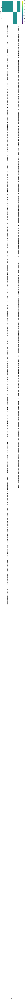

In [44]:
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Category'].value_counts()
    for x_label, grp in _df_3.groupby('Text')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Text')
_ = plt.ylabel('Category')

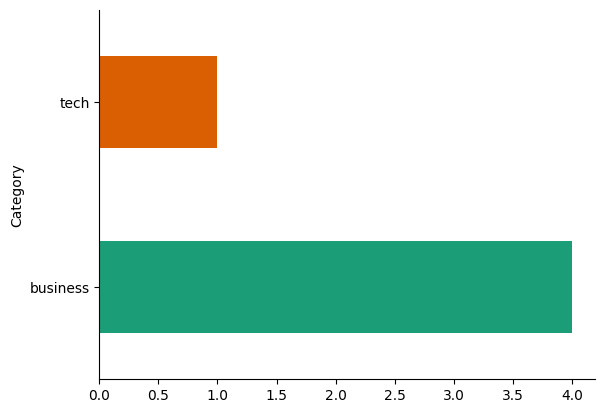

In [42]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('Category').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

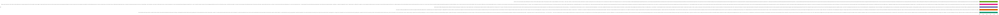

In [43]:
from matplotlib import pyplot as plt
import seaborn as sns
_df_0.groupby('Text').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

    - Stemming

In [45]:
# Import PorterStemmer from NLTK Library
from nltk.stem.porter import PorterStemmer

# Import PorterStemmer from NLTK Library
import nltk
# from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

# Download NLTK data
nltk.download('punkt')

# Intilize Stemmer
stemmer = PorterStemmer()

# This Function Will Stem Words
def stem_words(text):
    return " ".join([stemmer.stem(word) for word in text.split()])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [46]:
stem_words(df.Cleaned_Text[0])

'worldcom exboss launch defenc lawyer defend former worldcom chief berni ebber batteri fraud charg call compani whistleblow first wit cynthia cooper worldcom exhead intern account alert director irregular account practic us telecom giant 2002 warn led collaps firm follow discoveri 11bn £57bn account fraud mr ebber plead guilti charg fraud conspiraci prosecut lawyer argu mr ebber orchestr seri account trick worldcom order employe hide expens inflat revenu meet wall street earn estim ms cooper run consult busi told juri new york wednesday extern auditor arthur andersen approv worldcom account earli 2001 2002 said andersen given green light procedur practic use worldcom mr ebber lawyer said unawar fraud argu auditor alert problem ms cooper also said sharehold meet mr ebber often pass technic question compani financ chief give brief answer prosecut star wit former worldcom financi chief scott sullivan said mr ebber order account adjust firm tell hit book howev ms cooper said mr sullivan me

In [47]:
df.Cleaned_Text[0]

'worldcom exboss launches defence lawyers defending former worldcom chief bernie ebbers   battery  fraud charges  called  company whistleblower   first witness cynthia cooper worldcom  exhead  internal accounting alerted directors  irregular accounting practices   us telecoms giant  2002  warnings led   collapse   firm following  discovery   11bn £57bn accounting fraud mr ebbers  pleaded  guilty  charges  fraud  conspiracy prosecution lawyers  argued  mr ebbers orchestrated  series  accounting tricks  worldcom ordering employees  hide expenses  inflate revenues  meet wall street earnings estimates  ms cooper   runs   consulting business told  jury  new york  wednesday  external auditors arthur andersen  approved worldcom  accounting  early 2001  2002  said andersen  given  green light   procedures  practices used  worldcom mr ebber  lawyers  said   unaware   fraud arguing  auditors   alert    problems ms cooper also said   shareholder meetings mr ebbers often passed  technical question

***

### Lemmatization

    - 1st method of making func for lemmatization

In [48]:
# from nltk.corpus import wordnet
# from nltk import pos_tag, word_tokenize
# from nltk.stem import WordNetLemmatizer

# # Ensure necessary NLTK data is downloaded
# nltk.download('punkt')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('wordnet')


# # Initialize the WordNet Lemmatizer
# lemmatizer = WordNetLemmatizer()

# # Function to map NLTK POS tags to WordNet POS tags
# def get_wordnet_pos(tag):
#     if tag.startswith('A'):
#         return wordnet.ADJ
#     elif tag.startswith('V'):
#         return wordnet.VERB
#     elif tag.startswith('N'):
#         return wordnet.NOUN
#     elif tag.startswith('R'):
#         return wordnet.ADV
#     else:
#         return wordnet.NOUN

# # Function to perform POS tagging and lemmatization
# def pos_tagging_and_lemmatization(text):
#     # Tokenize the text
#     tokenized_text = word_tokenize(text)

#     # POS tagging
#     pos_tags = pos_tag(tokenized_text)

#     # Lemmatization based on POS tagging
#     lemmatized_words = []
#     for word, tag in pos_tags:
#         # Get the WordNet POS tag
#         wordnet_pos = get_wordnet_pos(tag)
#         # Lemmatize the word
#         lemmatized_word = lemmatizer.lemmatize(word, pos=wordnet_pos)
#         lemmatized_words.append(lemmatized_word)

#     return ' '.join(lemmatized_words)

# # # Apply the function to each row in the DataFrame
# # df['Cleaned_Text'] = df['Cleaned_Text'].apply(pos_tagging_and_lemmatization)

# # # Output the DataFrame with original and lemmatized text
# # df

In [49]:
# df.Cleaned_Text[0]

In [50]:
# pos_tagging_and_lemmatization(df.Cleaned_Text[0])

In [51]:
# new_text_3

    - 2nd method of making func for lemmatization

           -> Applying Lemmatization for every part of speech to the dataframe seperately

In [52]:
import pandas as pd
from nltk.stem import WordNetLemmatizer
import nltk

# Initialize Lemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

# Download necessary NLTK data
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [53]:
# Define a function to lemmatize text
def lemmatize_text(text):
    # Initialize punctuations
    punctuations = "?:!.,;"
    # Tokenize the text into words
    sentence_words = nltk.word_tokenize(text)
    # Remove punctuation
    sentence_words = [word for word in sentence_words if word not in punctuations]

    # Lemmatize each word
    """
    apply this func 4-time on dataframe in such a way that each time `pos` param is different:
    ('n': Noun
    'v': Verb
    'a': Adjective
    'r': Adverb)
    """
    lemmatized_words = [wordnet_lemmatizer.lemmatize(word, pos='n') for word in sentence_words]
    return ' '.join(lemmatized_words)

In [54]:
# Apply the function to each row in the DataFrame using .loc to avoid SettingWithCopyWarning
df.loc[:, 'Cleaned_Text'] = df['Cleaned_Text'].apply(lemmatize_text)

# Output the DataFrame with original and lemmatized text
df.head()

,Text,Category,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,worldcom exboss launch defence lawyer defendin...
1,german business confidence slides german busin...,business,german business confidence slide german busine...
2,bbc poll indicates economic gloom citizens in ...,business,bbc poll indicates economic gloom citizen majo...
3,lifestyle governs mobile choice faster bett...,tech,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,enron boss 168m payout eighteen former enron d...


In [55]:
df.Text[0]

'worldcom ex-boss launches defence lawyers defending former worldcom chief bernie ebbers against a battery of fraud charges have called a company whistleblower as their first witness.  cynthia cooper  worldcom s ex-head of internal accounting  alerted directors to irregular accounting practices at the us telecoms giant in 2002. her warnings led to the collapse of the firm following the discovery of an $11bn (£5.7bn) accounting fraud. mr ebbers has pleaded not guilty to charges of fraud and conspiracy.  prosecution lawyers have argued that mr ebbers orchestrated a series of accounting tricks at worldcom  ordering employees to hide expenses and inflate revenues to meet wall street earnings estimates. but ms cooper  who now runs her own consulting business  told a jury in new york on wednesday that external auditors arthur andersen had approved worldcom s accounting in early 2001 and 2002. she said andersen had given a  green light  to the procedures and practices used by worldcom. mr ebb

In [56]:
df.Cleaned_Text[0]

'worldcom exboss launch defence lawyer defending former worldcom chief bernie ebbers battery fraud charge called company whistleblower first witness cynthia cooper worldcom exhead internal accounting alerted director irregular accounting practice u telecom giant 2002 warning led collapse firm following discovery 11bn £57bn accounting fraud mr ebbers pleaded guilty charge fraud conspiracy prosecution lawyer argued mr ebbers orchestrated series accounting trick worldcom ordering employee hide expense inflate revenue meet wall street earnings estimate m cooper run consulting business told jury new york wednesday external auditor arthur andersen approved worldcom accounting early 2001 2002 said andersen given green light procedure practice used worldcom mr ebber lawyer said unaware fraud arguing auditor alert problem m cooper also said shareholder meeting mr ebbers often passed technical question company finance chief giving brief answer prosecution star witness former worldcom financial c

In [57]:
# df

    - 3rd method of making func for lemmatization

In [58]:
# # Define a function to lemmatize text
# def lemmatize_text(text, pos=None):
#     # Initialize punctuations
#     punctuations = "?:!.,;"
#     # Tokenize the text into words
#     sentence_words = nltk.word_tokenize(text)
#     # Remove punctuation
#     sentence_words = [word for word in sentence_words if word not in punctuations]

#     # Lemmatize each word with the specified part of speech
#     if pos == 'n':
#         lemmatized_words = [wordnet_lemmatizer.lemmatize(word, pos='n') for word in sentence_words]
#     elif pos == 'v':
#         lemmatized_words = [wordnet_lemmatizer.lemmatize(word, pos='v') for word in sentence_words]
#     elif pos == 'a':
#         lemmatized_words = [wordnet_lemmatizer.lemmatize(word, pos='a') for word in sentence_words]
#     elif pos == 'r':
#         lemmatized_words = [wordnet_lemmatizer.lemmatize(word, pos='r') for word in sentence_words]
#     else:
#         lemmatized_words = [wordnet_lemmatizer.lemmatize(word) for word in sentence_words]

#     return ' '.join(lemmatized_words)

In [59]:
# df.Cleaned_Text[0]

In [60]:
# text_0X = lemmatize_text(text_0X, pos="r")
# text_0X

***

To save your modified DataFrame to a file, you can use pandas' `to_csv()` method if you want to save it as a CSV file. Alternatively, you can use other formats like Excel, JSON, etc., depending on your needs.

Here's how to save your DataFrame as a CSV file:

```python
# Specify the filename and path where you want to save the DataFrame
output_filename = "lemmatized_data.csv"

# Save the DataFrame to a CSV file
df.to_csv(output_filename, index=False)
```

### Explanation:
- **`output_filename`**: The name of the file where you want to save the DataFrame. You can specify a path if you want to save it in a specific directory.
- **`index=False`**: This parameter ensures that the index of the DataFrame is not saved to the CSV file.

If you'd like to save the DataFrame in another format, here are some alternatives:

1. **Excel file:**
   ```python
   output_filename = "lemmatized_data.xlsx"
   df.to_excel(output_filename, index=False)
   ```

2. **JSON file:**
   ```python
   output_filename = "lemmatized_data.json"
   df.to_json(output_filename, orient='records', lines=True)
   ```

3. **Pickle file:**
   ```python
   output_filename = "lemmatized_data.pkl"
   df.to_pickle(output_filename)
   ```

You can choose the format that best suits your needs.

***
***

In [61]:
# Specify the filename and path where you want to save the DataFrame
output_filename = "lemmatized_data.csv"

# Save the DataFrame to a CSV file
df.to_csv(output_filename, index=True)

### Load the preprocessed dataset (lemmatized_data)

In [62]:
# Load the dataset
df = pd.read_csv('/content/lemmatized_data.csv')
df = df[['Text','Category','Cleaned_Text']]
df.head()

,Text,Category,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,worldcom exboss launch defence lawyer defendin...
1,german business confidence slides german busin...,business,german business confidence slide german busine...
2,bbc poll indicates economic gloom citizens in ...,business,bbc poll indicates economic gloom citizen majo...
3,lifestyle governs mobile choice faster bett...,tech,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,enron boss 168m payout eighteen former enron d...


In [64]:
df.head()

,Text,Category,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,worldcom exboss launch defence lawyer defendin...
1,german business confidence slides german busin...,business,german business confidence slide german busine...
2,bbc poll indicates economic gloom citizens in ...,business,bbc poll indicates economic gloom citizen majo...
3,lifestyle governs mobile choice faster bett...,tech,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,enron boss 168m payout eighteen former enron d...


from matplotlib import pyplot as plt
import seaborn as sns
_df_5.groupby('Text').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_6.groupby('Category').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_7.groupby('Cleaned_Text').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Category'].value_counts()
    for x_label, grp in _df_8.groupby('Text')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Text')
_ = plt.ylabel('Category')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Cleaned_Text'].value_counts()
    for x_label, grp in _df_9.groupby('Category')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Category')
_ = plt.ylabel('Cleaned_Text')

# Step 5: Split the Dataset

    - split into feature and target variable
    

In [65]:
# Define feature and target variable
X = df['Cleaned_Text']
y = df['Category']

print(X.shape)
print(y.shape)

(1490,)
(1490,)


    - split into test and train

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [67]:
X_train.shape, y_train.shape

((1192,), (1192,))

In [68]:
X_test.shape, y_test.shape

((298,), (298,))

# Step 6: Feature Extraction
        
    - Applying CountVectorizer Vectorization

In [97]:
# Initialize CountVectorizer
vectorizer = CountVectorizer()

# Fit and transform the text data to numerical vectors for both training and test sets
X_train_counts = vectorizer.fit_transform(X_train)
X_test_counts = vectorizer.transform(X_test)

In [98]:
# print(X_train_counts)

In [99]:
print(X_train_counts.shape)

(1192, 22199)


In [100]:
print(X_test_counts.shape)

(298, 22199)


# Step 7: Train the Model

In [101]:
# Initialize and train the Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_counts, y_train)

RandomForestClassifier(random_state=42)

In [102]:
# Predict on the test set
y_pred = model.predict(X_test_counts)

In [90]:
# len(y_pred)
# y_pred

# Step 8: Evaluate the Model

In [103]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

# Print the classification report
print('Classification Report:')
print(classification_report(y_test, y_pred))

Accuracy: 0.9698
Classification Report:
               precision    recall  f1-score   support

     business       0.95      0.99      0.97        75
entertainment       0.96      0.98      0.97        46
     politics       0.96      0.98      0.97        56
        sport       0.98      1.00      0.99        63
         tech       1.00      0.90      0.95        58

     accuracy                           0.97       298
    macro avg       0.97      0.97      0.97       298
 weighted avg       0.97      0.97      0.97       298



In [105]:
conf_matrix

array([[74,  0,  1,  0,  0],
       [ 1, 45,  0,  0,  0],
       [ 1,  0, 55,  0,  0],
       [ 0,  0,  0, 63,  0],
       [ 2,  2,  1,  1, 52]])

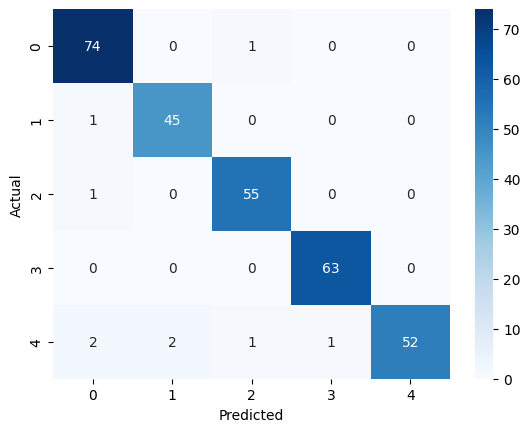

In [104]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

***

# To compare multiple classification models for your text classification project

In [106]:
df

,Text,Category,Cleaned_Text
0,worldcom ex-boss launches defence lawyers defe...,business,worldcom exboss launch defence lawyer defendin...
1,german business confidence slides german busin...,business,german business confidence slide german busine...
2,bbc poll indicates economic gloom citizens in ...,business,bbc poll indicates economic gloom citizen majo...
3,lifestyle governs mobile choice faster bett...,tech,lifestyle governs mobile choice faster better ...
4,enron bosses in $168m payout eighteen former e...,business,enron boss 168m payout eighteen former enron d...
...,...,...,...
1485,double eviction from big brother model caprice...,entertainment,double eviction big brother model caprice holb...
1486,dj double act revamp chart show dj duo jk and ...,entertainment,dj double act revamp chart show dj duo Just ki...
1487,weak dollar hits reuters revenues at media gro...,business,weak dollar hit reuters revenue medium group r...
1488,apple ipod family expands market apple has exp...,tech,apple ipod family expands market apple expande...


In [107]:
# # Split the dataset
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initialize CountVectorizer
# vectorizer = CountVectorizer()

# # Fit and transform the text data to numerical vectors for both training and test sets
# X_train_counts = vectorizer.fit_transform(X_train)
# X_test_counts = vectorizer.transform(X_test)

In [1]:
# # Define the models to compare
# models = {
#     'Naive Bayes': MultinomialNB(),
#     'Logistic Regression': LogisticRegression(max_iter=1000),
#     'Support Vector Machine': SVC(),
#     'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
#     'K-Nearest Neighbors': KNeighborsClassifier(),
#     'Decision Tree': DecisionTreeClassifier(),
#     'Perceptron': Perceptron()
# }

# # Train and evaluate each model
# results = {}
# for name, model in models.items():
#     # Train the model
#     model.fit(X_train_counts, y_train)

#     # Make predictions
#     y_pred = model.predict(X_test_counts)

#     # Evaluate the model
#     accuracy = accuracy_score(y_test, y_pred)
#     report = classification_report(y_test, y_pred)
#     conf_matrix = confusion_matrix(y_test, y_pred)

#     results[name] = {
#         'Accuracy': accuracy,
#         'Classification Report': report,
#         'Confusion Matrix': conf_matrix
#     }

#     # Print results
#     print(f"Model: {name}")
#     print(f"Accuracy: {accuracy:.4f}")
#     print("Classification Report:")
#     print(report)

#     # Plot confusion matrix
#     plt.figure(figsize=(10, 7))
#     sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
#     plt.title(f'Confusion Matrix for {name}')
#     plt.xlabel('Predicted')
#     plt.ylabel('Actual')
#     plt.show()


**Create N-gram models (unigrams, bigrams, trigrams) and transform the text data using these models.**


Using Unigrams... 

Model: Naive Bayes
Accuracy: 0.9832
Classification Report:
               precision    recall  f1-score   support

     business       0.99      0.97      0.98        75
entertainment       1.00      0.98      0.99        46
     politics       0.96      0.98      0.97        56
        sport       1.00      1.00      1.00        63
         tech       0.97      0.98      0.97        58

     accuracy                           0.98       298
    macro avg       0.98      0.98      0.98       298
 weighted avg       0.98      0.98      0.98       298



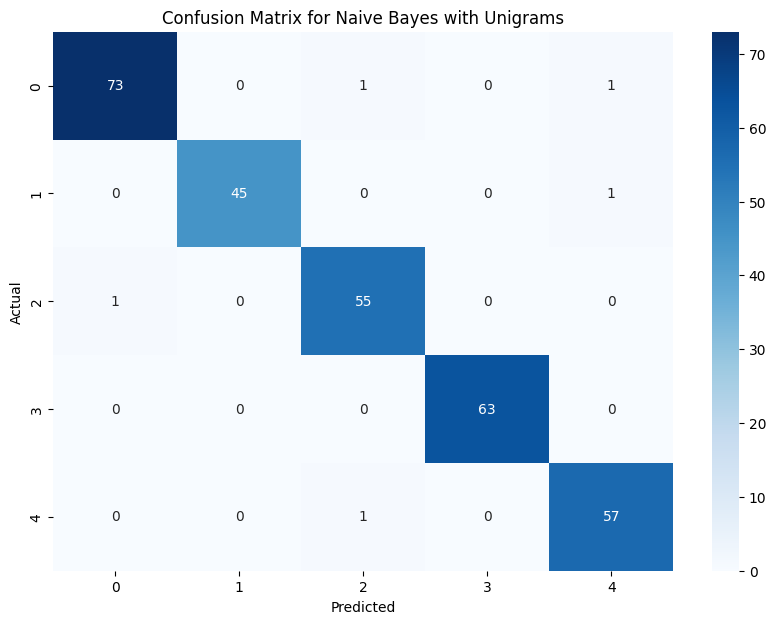

Model: Logistic Regression
Accuracy: 0.9664
Classification Report:
               precision    recall  f1-score   support

     business       0.96      0.99      0.97        75
entertainment       0.94      1.00      0.97        46
     politics       0.96      0.93      0.95        56
        sport       0.97      1.00      0.98        63
         tech       1.00      0.91      0.95        58

     accuracy                           0.97       298
    macro avg       0.97      0.97      0.97       298
 weighted avg       0.97      0.97      0.97       298



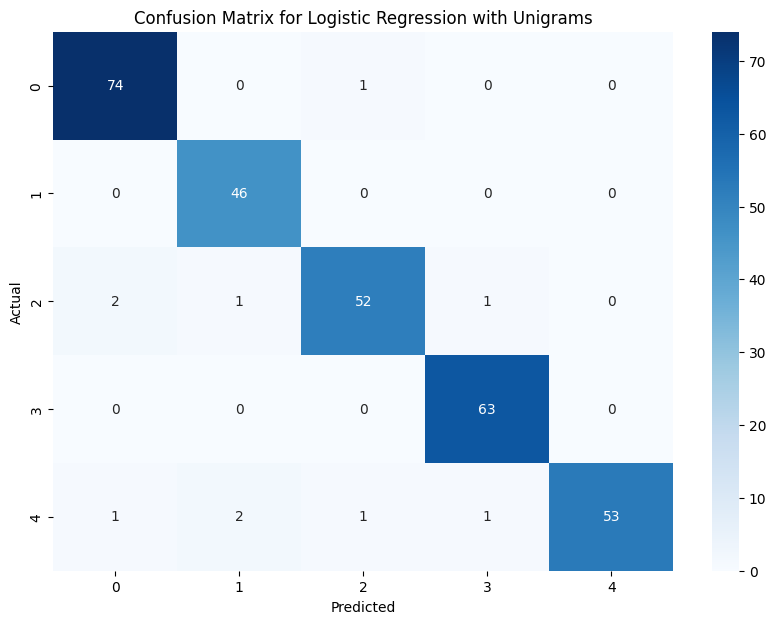

Model: Support Vector Machine
Accuracy: 0.9530
Classification Report:
               precision    recall  f1-score   support

     business       0.96      0.96      0.96        75
entertainment       0.94      0.96      0.95        46
     politics       0.96      0.91      0.94        56
        sport       0.98      1.00      0.99        63
         tech       0.92      0.93      0.92        58

     accuracy                           0.95       298
    macro avg       0.95      0.95      0.95       298
 weighted avg       0.95      0.95      0.95       298



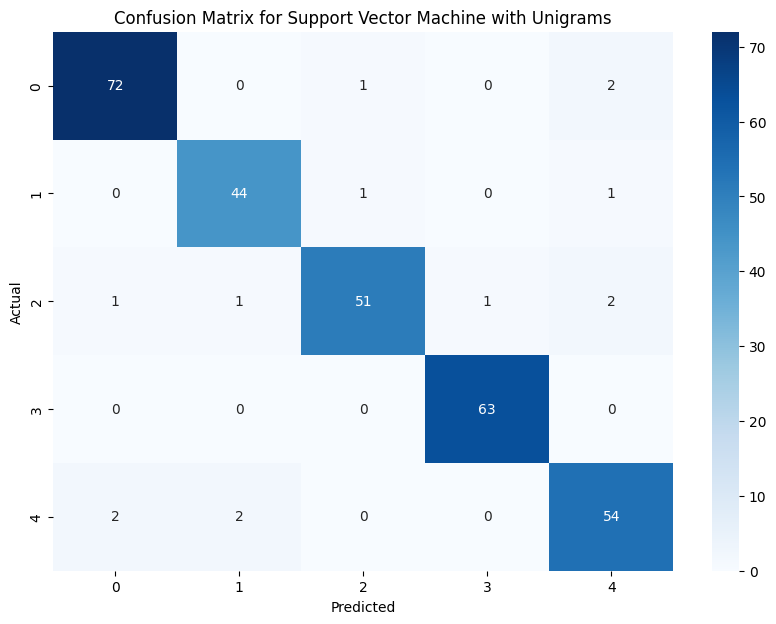

Model: Random Forest
Accuracy: 0.9698
Classification Report:
               precision    recall  f1-score   support

     business       0.95      0.99      0.97        75
entertainment       0.96      0.98      0.97        46
     politics       0.96      0.98      0.97        56
        sport       0.98      1.00      0.99        63
         tech       1.00      0.90      0.95        58

     accuracy                           0.97       298
    macro avg       0.97      0.97      0.97       298
 weighted avg       0.97      0.97      0.97       298



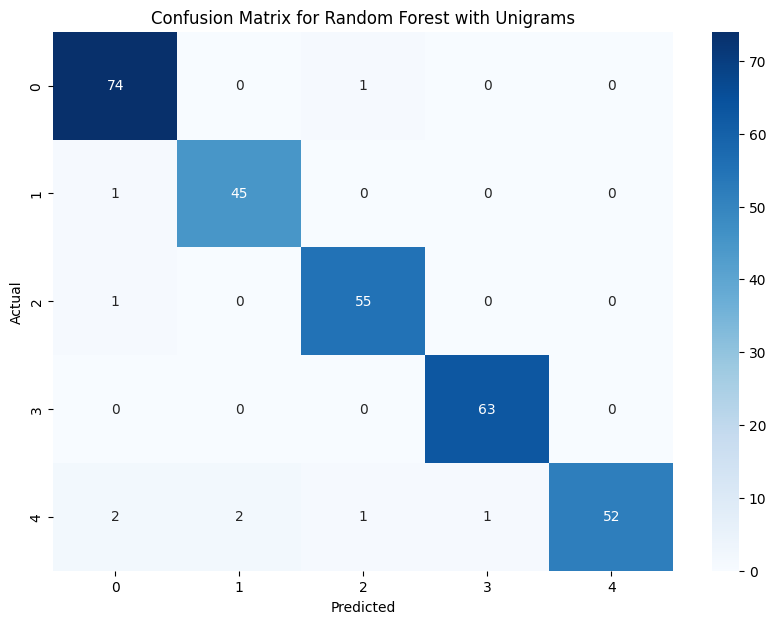

Model: K-Nearest Neighbors
Accuracy: 0.6141
Classification Report:
               precision    recall  f1-score   support

     business       1.00      0.48      0.65        75
entertainment       0.81      0.54      0.65        46
     politics       0.86      0.77      0.81        56
        sport       0.38      1.00      0.55        63
         tech       1.00      0.28      0.43        58

     accuracy                           0.61       298
    macro avg       0.81      0.61      0.62       298
 weighted avg       0.81      0.61      0.62       298



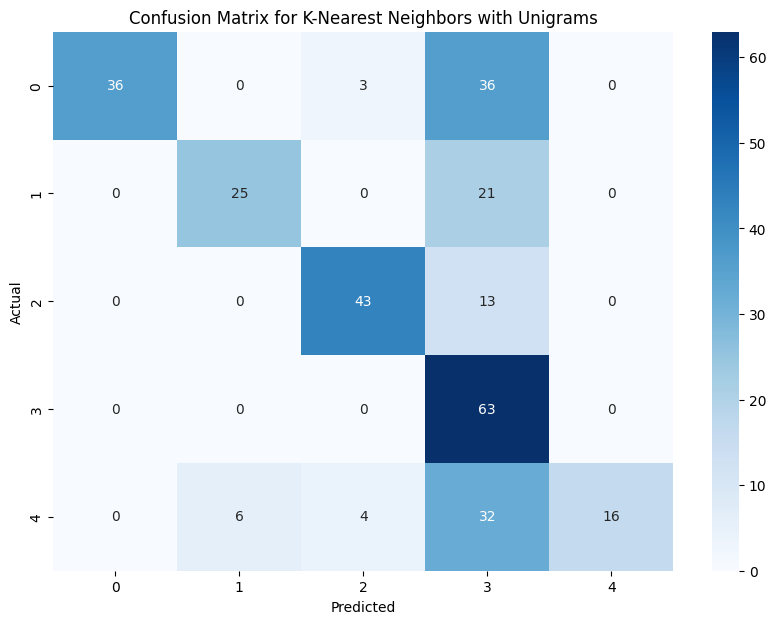

Model: Decision Tree
Accuracy: 0.8591
Classification Report:
               precision    recall  f1-score   support

     business       0.92      0.80      0.86        75
entertainment       0.89      0.91      0.90        46
     politics       0.78      0.84      0.81        56
        sport       0.85      0.95      0.90        63
         tech       0.85      0.81      0.83        58

     accuracy                           0.86       298
    macro avg       0.86      0.86      0.86       298
 weighted avg       0.86      0.86      0.86       298



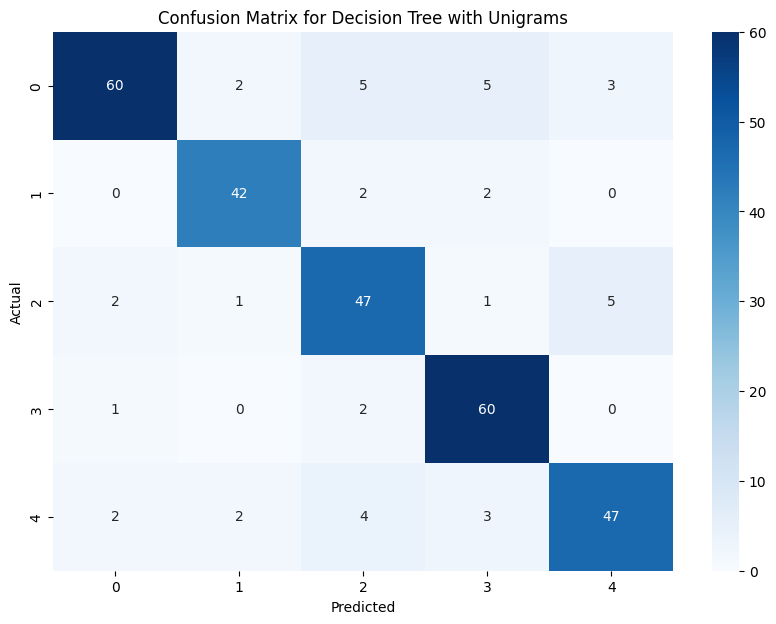

Model: Perceptron
Accuracy: 0.9698
Classification Report:
               precision    recall  f1-score   support

     business       0.95      0.99      0.97        75
entertainment       0.96      0.96      0.96        46
     politics       0.96      0.93      0.95        56
        sport       0.98      1.00      0.99        63
         tech       1.00      0.97      0.98        58

     accuracy                           0.97       298
    macro avg       0.97      0.97      0.97       298
 weighted avg       0.97      0.97      0.97       298



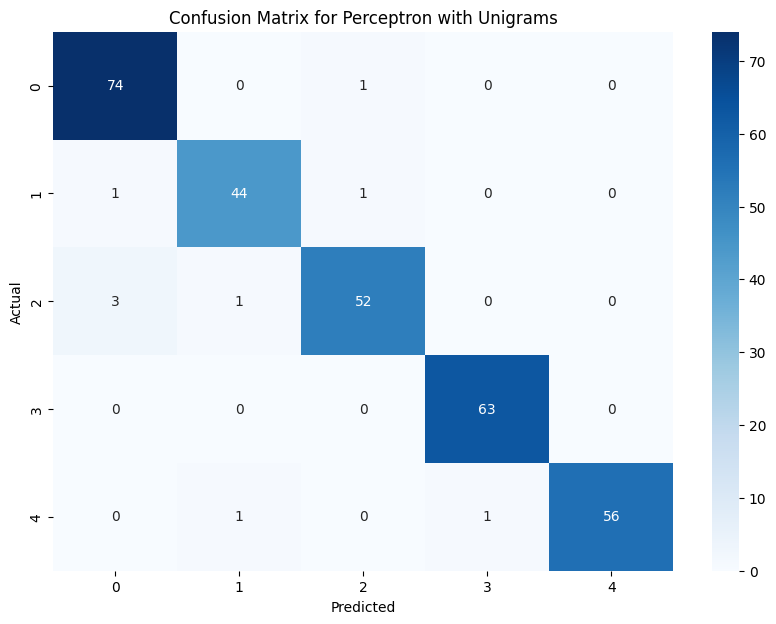

Using Bigrams... 

Model: Naive Bayes
Accuracy: 0.9832
Classification Report:
               precision    recall  f1-score   support

     business       0.99      0.97      0.98        75
entertainment       1.00      0.98      0.99        46
     politics       0.96      0.98      0.97        56
        sport       1.00      1.00      1.00        63
         tech       0.97      0.98      0.97        58

     accuracy                           0.98       298
    macro avg       0.98      0.98      0.98       298
 weighted avg       0.98      0.98      0.98       298



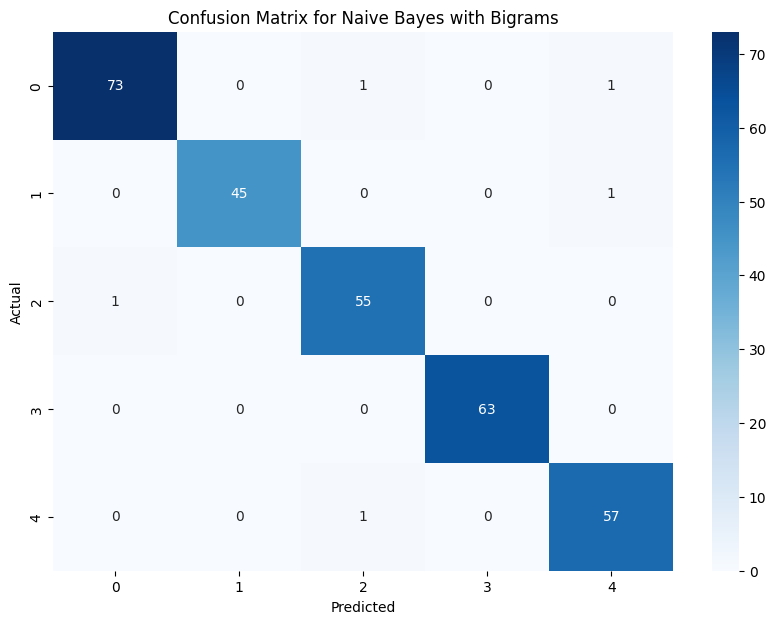

Model: Logistic Regression
Accuracy: 0.9631
Classification Report:
               precision    recall  f1-score   support

     business       0.96      0.99      0.97        75
entertainment       0.94      1.00      0.97        46
     politics       0.96      0.93      0.95        56
        sport       0.95      1.00      0.98        63
         tech       1.00      0.90      0.95        58

     accuracy                           0.96       298
    macro avg       0.96      0.96      0.96       298
 weighted avg       0.96      0.96      0.96       298



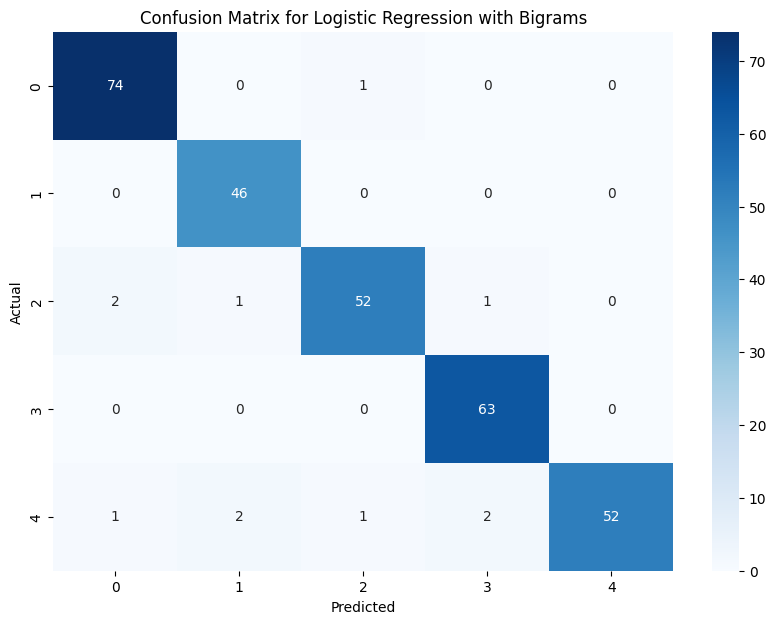

Model: Support Vector Machine
Accuracy: 0.9497
Classification Report:
               precision    recall  f1-score   support

     business       0.95      1.00      0.97        75
entertainment       0.90      0.98      0.94        46
     politics       0.98      0.91      0.94        56
        sport       0.95      1.00      0.98        63
         tech       0.96      0.84      0.90        58

     accuracy                           0.95       298
    macro avg       0.95      0.95      0.95       298
 weighted avg       0.95      0.95      0.95       298



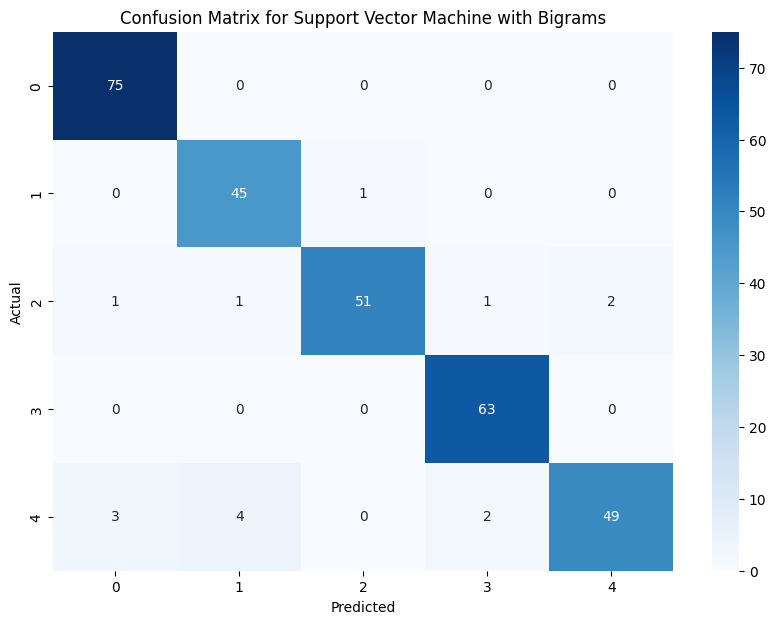

Model: Random Forest
Accuracy: 0.9430
Classification Report:
               precision    recall  f1-score   support

     business       0.90      0.97      0.94        75
entertainment       0.96      0.96      0.96        46
     politics       0.95      0.93      0.94        56
        sport       0.94      1.00      0.97        63
         tech       1.00      0.84      0.92        58

     accuracy                           0.94       298
    macro avg       0.95      0.94      0.94       298
 weighted avg       0.95      0.94      0.94       298



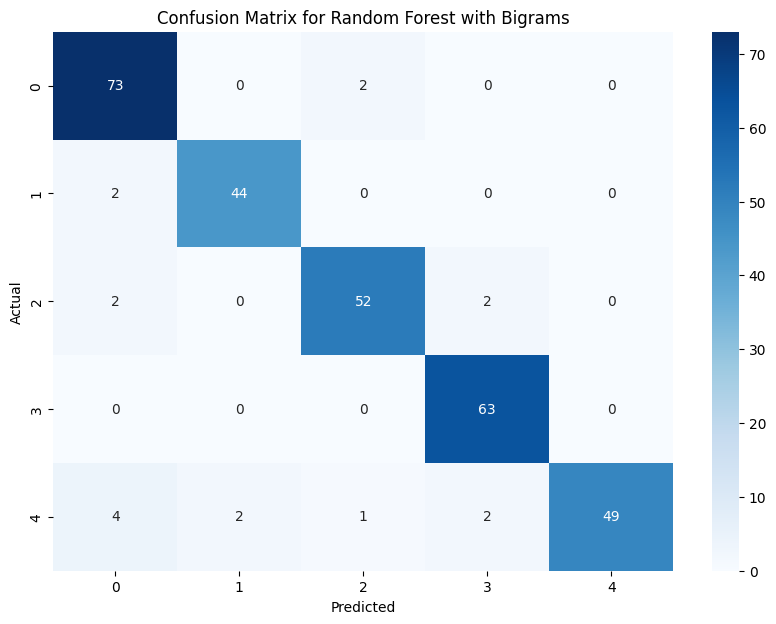

Model: K-Nearest Neighbors
Accuracy: 0.4664
Classification Report:
               precision    recall  f1-score   support

     business       1.00      0.19      0.31        75
entertainment       0.94      0.33      0.48        46
     politics       0.95      0.66      0.78        56
        sport       0.29      1.00      0.45        63
         tech       1.00      0.17      0.29        58

     accuracy                           0.47       298
    macro avg       0.83      0.47      0.46       298
 weighted avg       0.83      0.47      0.45       298



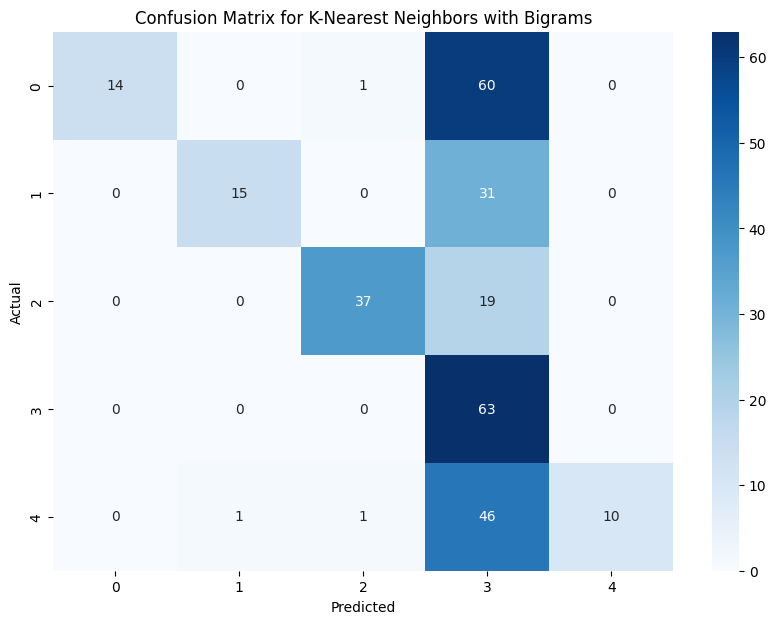

Model: Decision Tree
Accuracy: 0.8691
Classification Report:
               precision    recall  f1-score   support

     business       0.92      0.81      0.87        75
entertainment       0.86      0.91      0.88        46
     politics       0.82      0.89      0.85        56
        sport       0.83      0.94      0.88        63
         tech       0.92      0.81      0.86        58

     accuracy                           0.87       298
    macro avg       0.87      0.87      0.87       298
 weighted avg       0.87      0.87      0.87       298



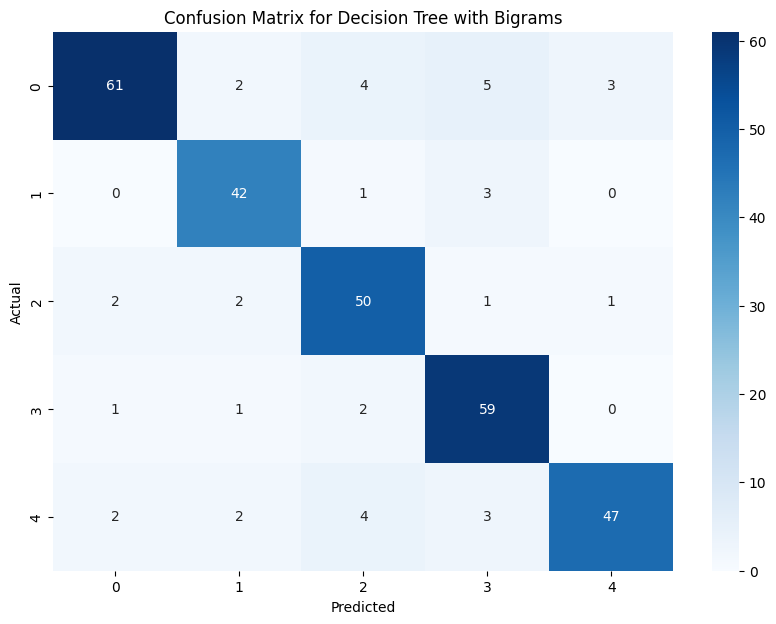

Model: Perceptron
Accuracy: 0.9698
Classification Report:
               precision    recall  f1-score   support

     business       0.97      0.97      0.97        75
entertainment       0.96      1.00      0.98        46
     politics       0.93      0.95      0.94        56
        sport       1.00      1.00      1.00        63
         tech       0.98      0.93      0.96        58

     accuracy                           0.97       298
    macro avg       0.97      0.97      0.97       298
 weighted avg       0.97      0.97      0.97       298



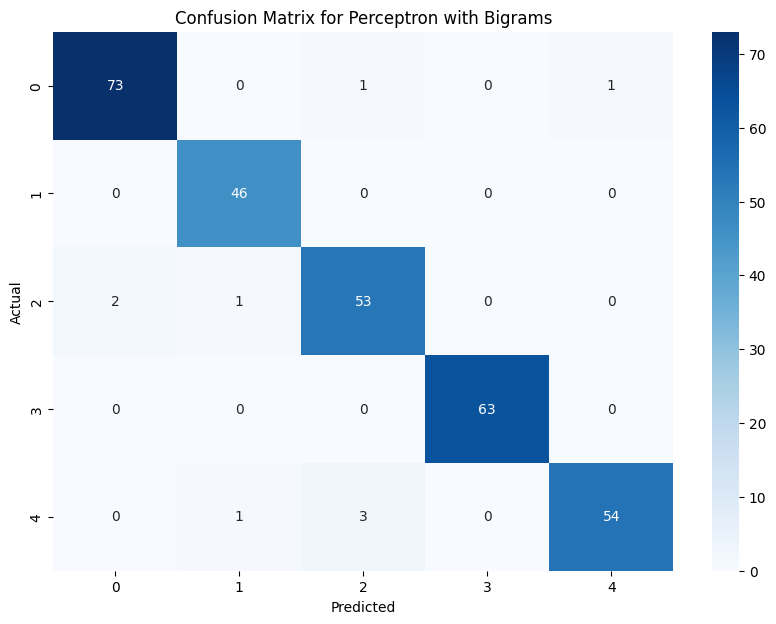

Using Trigrams... 

Model: Naive Bayes
Accuracy: 0.9866
Classification Report:
               precision    recall  f1-score   support

     business       1.00      0.97      0.99        75
entertainment       1.00      0.98      0.99        46
     politics       0.97      1.00      0.98        56
        sport       1.00      1.00      1.00        63
         tech       0.97      0.98      0.97        58

     accuracy                           0.99       298
    macro avg       0.99      0.99      0.99       298
 weighted avg       0.99      0.99      0.99       298



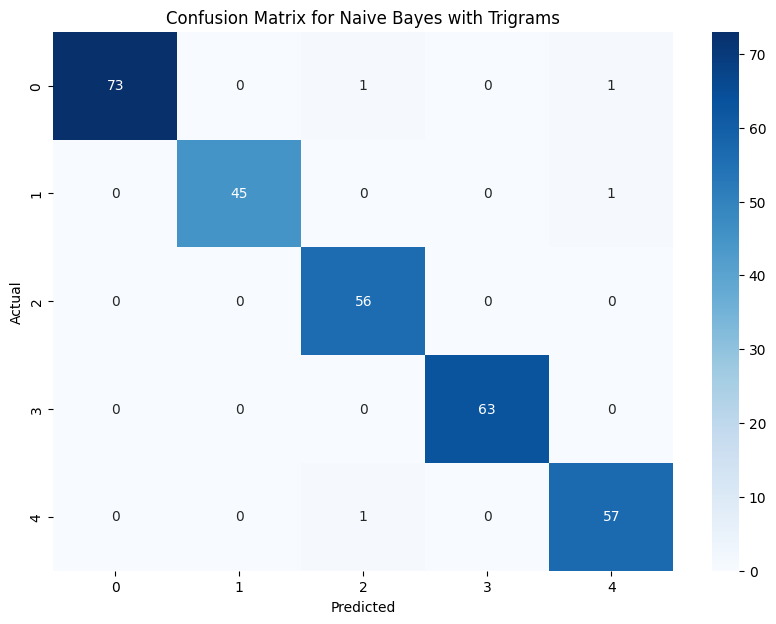

Model: Logistic Regression
Accuracy: 0.9631
Classification Report:
               precision    recall  f1-score   support

     business       0.96      0.99      0.97        75
entertainment       0.94      1.00      0.97        46
     politics       0.96      0.93      0.95        56
        sport       0.95      1.00      0.98        63
         tech       1.00      0.90      0.95        58

     accuracy                           0.96       298
    macro avg       0.96      0.96      0.96       298
 weighted avg       0.96      0.96      0.96       298



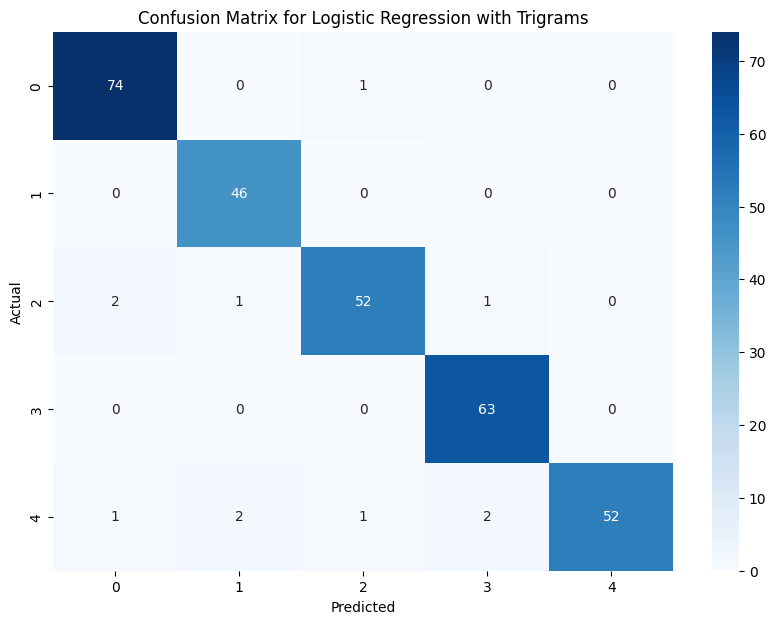

Model: Support Vector Machine
Accuracy: 0.9329
Classification Report:
               precision    recall  f1-score   support

     business       0.94      0.99      0.96        75
entertainment       0.87      0.98      0.92        46
     politics       1.00      0.89      0.94        56
        sport       0.91      1.00      0.95        63
         tech       0.96      0.79      0.87        58

     accuracy                           0.93       298
    macro avg       0.93      0.93      0.93       298
 weighted avg       0.94      0.93      0.93       298



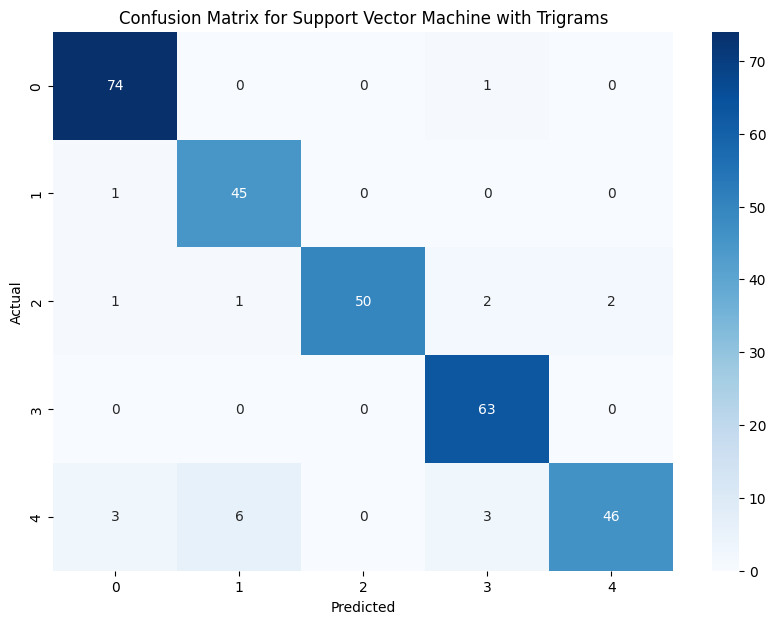

Model: Random Forest
Accuracy: 0.9530
Classification Report:
               precision    recall  f1-score   support

     business       0.95      0.99      0.97        75
entertainment       0.94      0.96      0.95        46
     politics       0.96      0.95      0.95        56
        sport       0.93      1.00      0.96        63
         tech       1.00      0.86      0.93        58

     accuracy                           0.95       298
    macro avg       0.95      0.95      0.95       298
 weighted avg       0.95      0.95      0.95       298



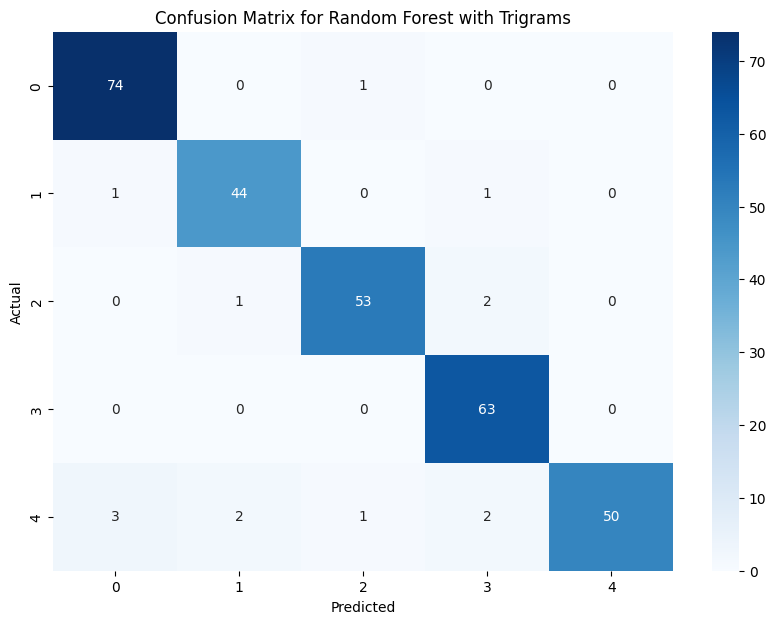

Model: K-Nearest Neighbors
Accuracy: 0.3960
Classification Report:
               precision    recall  f1-score   support

     business       1.00      0.09      0.17        75
entertainment       0.91      0.22      0.35        46
     politics       1.00      0.55      0.71        56
        sport       0.26      1.00      0.41        63
         tech       1.00      0.12      0.22        58

     accuracy                           0.40       298
    macro avg       0.83      0.40      0.37       298
 weighted avg       0.83      0.40      0.36       298



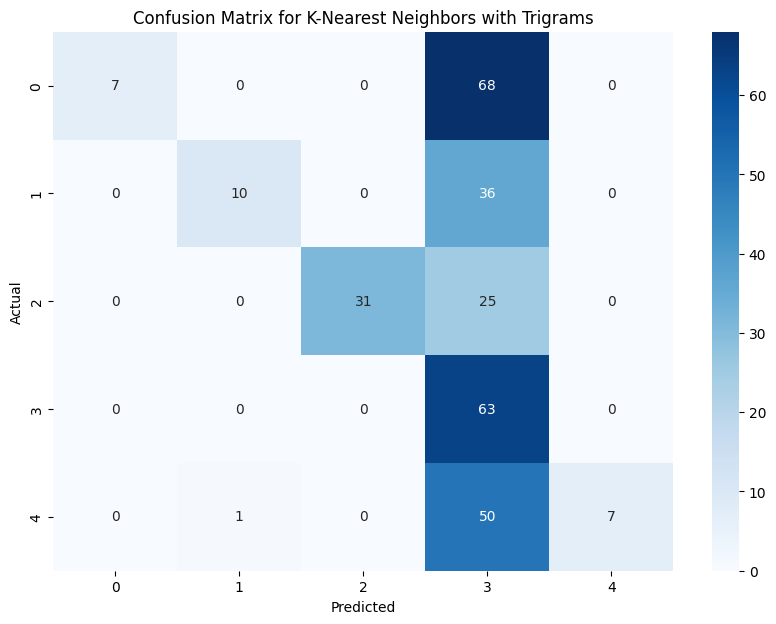

Model: Decision Tree
Accuracy: 0.8523
Classification Report:
               precision    recall  f1-score   support

     business       0.86      0.79      0.82        75
entertainment       0.81      0.85      0.83        46
     politics       0.84      0.86      0.85        56
        sport       0.86      0.95      0.90        63
         tech       0.89      0.83      0.86        58

     accuracy                           0.85       298
    macro avg       0.85      0.85      0.85       298
 weighted avg       0.85      0.85      0.85       298



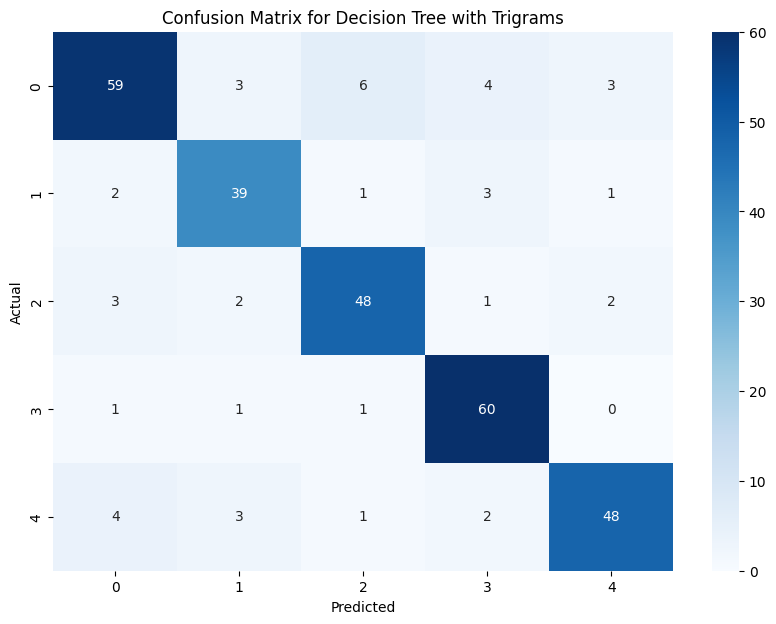

Model: Perceptron
Accuracy: 0.9698
Classification Report:
               precision    recall  f1-score   support

     business       0.97      0.95      0.96        75
entertainment       0.96      1.00      0.98        46
     politics       0.96      0.96      0.96        56
        sport       0.98      1.00      0.99        63
         tech       0.96      0.95      0.96        58

     accuracy                           0.97       298
    macro avg       0.97      0.97      0.97       298
 weighted avg       0.97      0.97      0.97       298



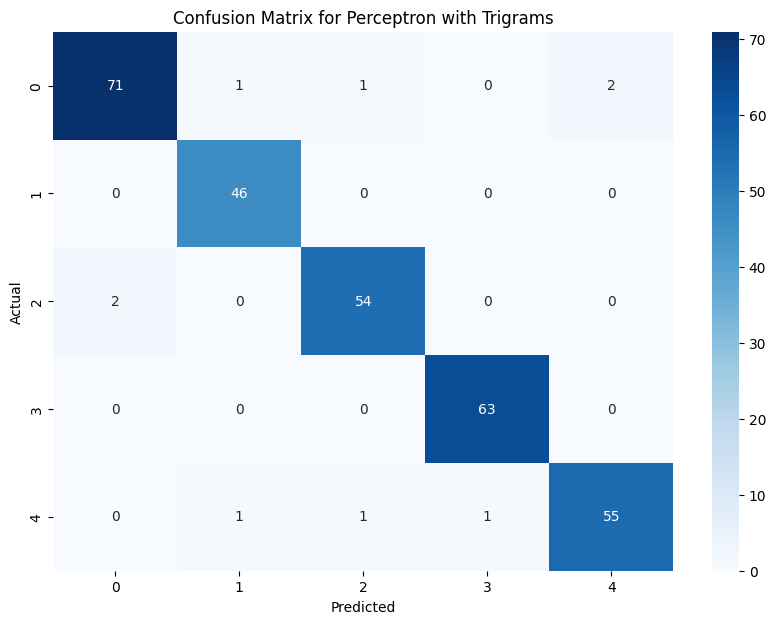

In [109]:
# Define the models to compare
models = {
    'Naive Bayes': MultinomialNB(),
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Support Vector Machine': SVC(),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Perceptron': Perceptron()
}

# Define N-gram settings
ngram_models = {
    'Unigrams': (1, 1),
    'Bigrams': (1, 2),
    'Trigrams': (1, 3)
}

# Store results
all_results = {}

for ngram_name, ngram_range in ngram_models.items():
    print(f"Using {ngram_name}... \n")

    # Initialize CountVectorizer with the current N-gram setting
    vectorizer = CountVectorizer(ngram_range=ngram_range)

    # Transform the text data to numerical vectors
    X_train_counts = vectorizer.fit_transform(X_train)
    X_test_counts = vectorizer.transform(X_test)

    # Train and evaluate each model
    results = {}
    for name, model in models.items():
        # Train the model
        model.fit(X_train_counts, y_train)

        # Make predictions
        y_pred = model.predict(X_test_counts)

        # Evaluate the model
        accuracy = accuracy_score(y_test, y_pred)
        report = classification_report(y_test, y_pred)
        conf_matrix = confusion_matrix(y_test, y_pred)

        results[name] = {
            'Accuracy': accuracy,
            'Classification Report': report,
            'Confusion Matrix': conf_matrix
        }

        # Print results
        print(f"Model: {name}")
        print(f"Accuracy: {accuracy:.4f}")
        print("Classification Report:")
        print(report)

        # Plot confusion matrix
        plt.figure(figsize=(10, 7))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Confusion Matrix for {name} with {ngram_name}')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

    all_results[ngram_name] = results


## Models Classification on a New Data

In [110]:
# Define new text data for prediction
new_texts = [
    "The latest tech innovations are transforming the industry.",
    "Political leaders are debating new economic policies.",
    "The sports event last night was thrilling and action-packed.",
    "A new movie release is trending among entertainment enthusiasts.",
    "Stock markets are seeing significant fluctuations this week."
]

# Transform the new text data using the fitted CountVectorizer
new_texts_counts = vectorizer.transform(new_texts)

# Make predictions on new text data using each model and print the results
for name, model in models.items():
    new_predictions = model.predict(new_texts_counts)
    print(f"Predictions for {name}:")
    for text, prediction in zip(new_texts, new_predictions):
        print(f"Text: '{text}'\nPredicted Category: {prediction}\n")
    print("="*50)

Predictions for Naive Bayes:
Text: 'The latest tech innovations are transforming the industry.'
Predicted Category: tech

Text: 'Political leaders are debating new economic policies.'
Predicted Category: business

Text: 'The sports event last night was thrilling and action-packed.'
Predicted Category: sport

Text: 'A new movie release is trending among entertainment enthusiasts.'
Predicted Category: entertainment

Text: 'Stock markets are seeing significant fluctuations this week.'
Predicted Category: business

Predictions for Logistic Regression:
Text: 'The latest tech innovations are transforming the industry.'
Predicted Category: sport

Text: 'Political leaders are debating new economic policies.'
Predicted Category: sport

Text: 'The sports event last night was thrilling and action-packed.'
Predicted Category: sport

Text: 'A new movie release is trending among entertainment enthusiasts.'
Predicted Category: sport

Text: 'Stock markets are seeing significant fluctuations this week.